<h2><center>THE CHINESE UNIVERSITY OF HONG KONG<br /> 
    Department of Mathematics<br />
 MATH4280<br />
    Innovation and Design in Big Data Analytics</center></h2>

# Tutorial 8<a id='top'></a>

- <a href='#section1'>8.1 K-means clustering</a>
- <a href='#section2'>8.2 Hierarchical Clustering </a>


## 8.1 K-means clustering
<a id='section1'></a>

K-means clustering is a clustering algorithm that aims to partition n observations into k clusters.

There are 3 steps:

- Initialisation – K initial “means” (centroids) are generated at random
- Assignment – K clusters are created by associating each observation with the nearest centroid
- Update – The centroid of the clusters becomes the new mean

Assignment and Update are repeated iteratively until convergence

The end result is that the sum of squared errors is minimised between points and their respective centroids.

We’ll do this manually first, then show how it’s done using scikit-learn

Let’s view it in action using k=3:

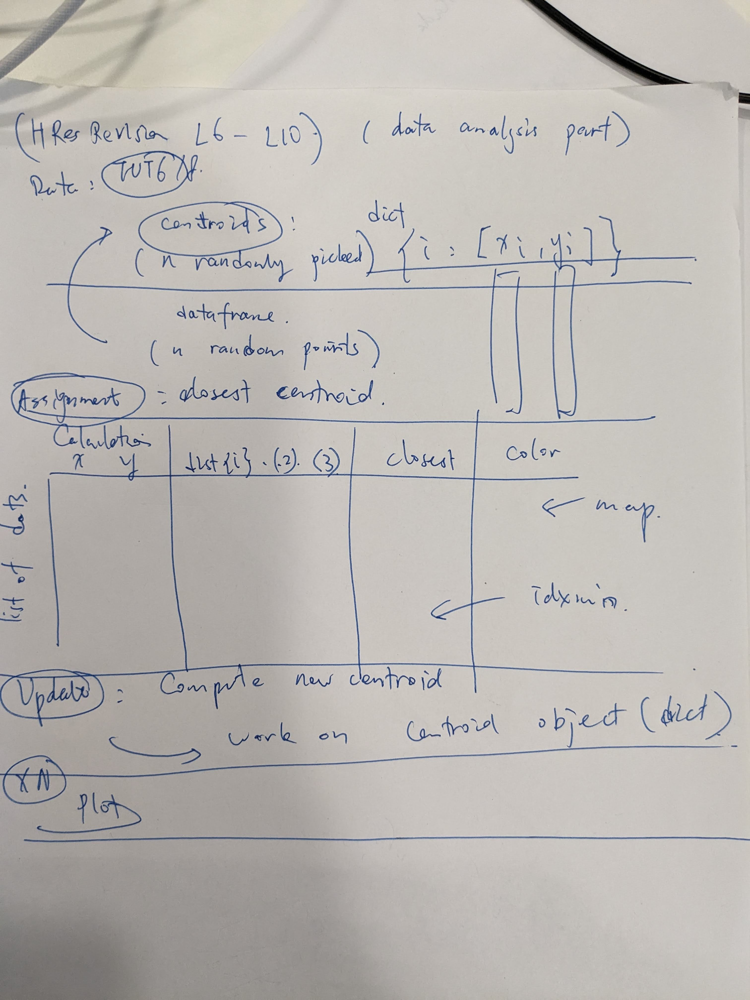

In [1]:
# import sys
# !{sys.executable} -m pip install cvxpy

{1: [26, 16], 2: [68, 42], 3: [55, 76]}
<class 'dict'>


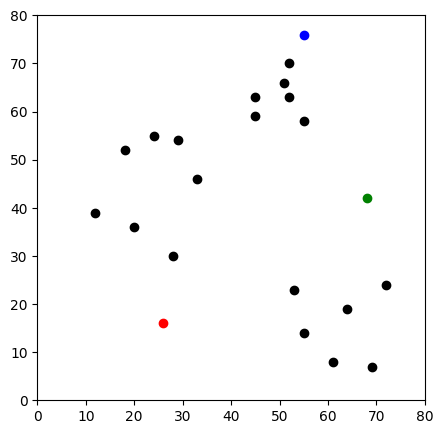

In [2]:
## Initialisation

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

"""
Fixed location of data points contained by a dataframe. 

SO the rows of the dataframe are the data points, 
and the columns of the dataframe are the coordinates of the data points.
"""

df = pd.DataFrame({
    'x': [12, 20, 28, 18, 29, 33, 24, 45, 45, 52, 51, 52, 55, 53, 55, 61, 64, 69, 72],
    'y': [39, 36, 30, 52, 54, 46, 55, 59, 63, 70, 66, 63, 58, 23, 14, 8, 19, 7, 24]
})

"""
Creating random starting points for the centroids

A dict that contains the coordinates of the centroids
Key is the centroid number (1-indexed), value is the coordinate of the centroid (x,y)
"""
np.random.seed(200)
k = 3
# centroids[i] = [x, y]
centroids = {
    i+1: [np.random.randint(0, 80), np.random.randint(0, 80)]
    for i in range(k)
}
print(centroids)
print(type(centroids))

"""
Setting up the plot.

K-mean clustering is an iterative process, but not started yet.
"""
fig = plt.figure(figsize=(5, 5))
plt.scatter(df['x'], df['y'], color='k')

""" 
Plotting 3 initial centroids: 
"""
colmap = {1: 'r', 2: 'g', 3: 'b'}
for i in centroids.keys():
    plt.scatter(*centroids[i], color=colmap[i])
plt.xlim(0, 80)
plt.ylim(0, 80)
plt.show()

# 1. `idxmin()`

`idxmin(axis=0)`: axis default is 0 (which means returning the minima row/index name)

example:
``` 
                consumption  co2_emissions
Pork                  10.51         37.20
Wheat Products       103.11         19.66
Beef                  55.48       1712.00
```

`df.idxmin()`:  It look up minima across rows, and returns mimimal row/index name for each column.

``` 
consumption                Pork
co2_emissions    Wheat Products
dtype: object
```


Conversely, we can use `df.idxmin(axis=1)` to do it in another direction. And the following block is doing such thing. 

# 2. `map()`

It map values of Series according to an input mapping or function.

- It accepts `dict` or `Series`. Values that are not found in `dict` are converted to `NaN`.

For example:
```
0      cat
1      dog
2      NaN
3   rabbit
dtype: object
```

- Now we apply `s.map({'cat': 'kitten', 'dog': 'puppy'})`, the dataframe will be:
``` 
0   kitten
1    puppy
2      NaN
3      NaN
```

We see a pattern that `s.map(<matcher>: <replace_value>)`. For value that cannot be find in the input dictionary, these values will be converted into `NaN`.

    x   y  distance_from_1  distance_from_2  distance_from_3  closest color
0  12  39        26.925824        56.080300        56.727418        1     r
1  20  36        20.880613        48.373546        53.150729        1     r
2  28  30        14.142136        41.761226        53.338541        1     r
3  18  52        36.878178        50.990195        44.102154        1     r
4  29  54        38.118237        40.804412        34.058773        3     b


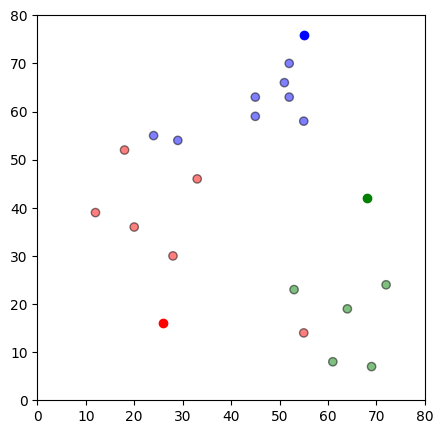

In [3]:
## Assignment Stage

def assignment(df, centroids):
    """
    Assigns data points in the input dataframe to the nearest centroid based on Euclidean distance.

    Parameters:
        df (pd.DataFrame): Input dataframe containing 'x' and 'y' columns representing coordinates of data points.
        centroids (dict): Dictionary containing centroid labels as keys and corresponding (x, y) coordinates as values.

    Returns:
        pd.DataFrame: Updated dataframe with additional columns indicating distances from each centroid, closest centroid label,
                      and assigned color for each data point.
    """

    # Iterate through each centroid
    # centroids.keys(): getting a list of keys from the dictionary. 
    """  
    Here, we create a list of columns that calculates the distance from that specific point to centroid i. 
    
    The numerical value of the distance is calcuated by df['x'], df['y'], and centroids[i][0], centroids[i][1]. 
    Then it fills to df['distance_from_{}'.format(i)]. For len(i) = 3, then the list of new columns would be ['distance_from_1', 'distance_from_2', 'distance_from_3']
    """
    for i in centroids.keys():
        # Calculate Euclidean distance from the current centroid to all data points
        df['distance_from_{}'.format(i)] = (
            np.sqrt(
                (df['x'] - centroids[i][0]) ** 2
                + (df['y'] - centroids[i][1]) ** 2
            )
        )

    # List of column names representing distances from each centroid
    centroid_distance_cols = ['distance_from_{}'.format(i) for i in centroids.keys()]

    # Find the closest centroid for each data point by locating the minimum distance column name
    """ 
    `df.loc[:, centroid_distance_cols]` is a dataframe that contains only the columns in the list `centroid_distance_cols`.
    `df.loc[:, centroid_distance_cols].idxmin(axis=1)` returns Indexes of minima along the specified axis.
    
    After 
    """
    df['closest'] = df.loc[:, centroid_distance_cols].idxmin(axis=1)

    # Strip the column name to extract the centroid number, converting it to an integer
    df['closest'] = df['closest'].map(lambda x: int(x.lstrip('distance_from_')))

    # Map centroid numbers to colors using a predefined colormap (colmap)
    df['color'] = df['closest'].map(lambda x: colmap[x])

    # Return the updated dataframe with additional columns indicating assignments
    return df


df = assignment(df, centroids)
print(df.head())


"""
Plot the data points and the centroids with different colours, again.
"""
fig = plt.figure(figsize=(5, 5))
plt.scatter(df['x'], df['y'], color=df['color'], alpha=0.5, edgecolor='k')

# Here we use colormap to plot the centroids
for i in centroids.keys():
    plt.scatter(*centroids[i], color=colmap[i])
plt.xlim(0, 80)
plt.ylim(0, 80)
plt.show()

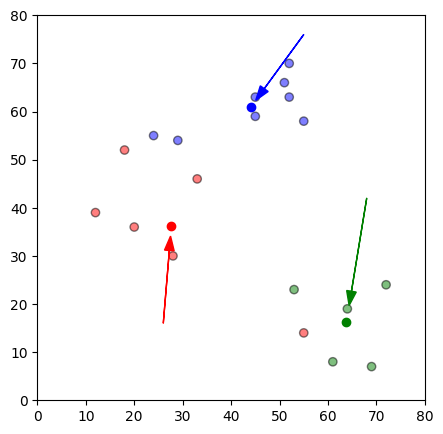

In [4]:
## Update Stage
"""
Update the centroids by taking the average of the all the data points assigned to that centroid.

Number of iteration = 1
"""

import copy

# deepcopy() is used to create a new copy of the dictionary,
old_centroids = copy.deepcopy(centroids)

def update(k):
    """
    Updates the centroids based on the mean coordinates of data points assigned to each centroid.

    Parameters:
    k (int): Number of centroids.

    Returns:
    int: Updated number of centroids after the centroids have been recalculated.
    """
    for i in centroids.keys():
        # Compute the mean x-coordinate for data points assigned to the current centroid 'i'
        centroids[i][0] = np.mean(df[df['closest'] == i]['x'])
        # Compute the mean y-coordinate for data points assigned to the current centroid 'i'
        centroids[i][1] = np.mean(df[df['closest'] == i]['y'])
    # The updated centroids are stored in the 'centroids' dictionary.
    # The updated value of 'k' (number of centroids) is returned.
    return k


centroids = update(centroids)


"""
Showing the updated chart
"""
fig = plt.figure(figsize=(5, 5))
ax = plt.axes()
plt.scatter(df['x'], df['y'], color=df['color'], alpha=0.5, edgecolor='k')
for i in centroids.keys():
    plt.scatter(*centroids[i], color=colmap[i])
plt.xlim(0, 80)
plt.ylim(0, 80)
for i in old_centroids.keys():
    # organize the old and new coordinates
    old_x = old_centroids[i][0]
    old_y = old_centroids[i][1]
    dx = (centroids[i][0] - old_centroids[i][0]) * 0.75
    dy = (centroids[i][1] - old_centroids[i][1]) * 0.75
    # Create arrow that shows the pathways of the centroid movement
    ax.arrow(old_x, old_y, dx, dy, head_width=2, head_length=3, fc=colmap[i], ec=colmap[i])
plt.show()

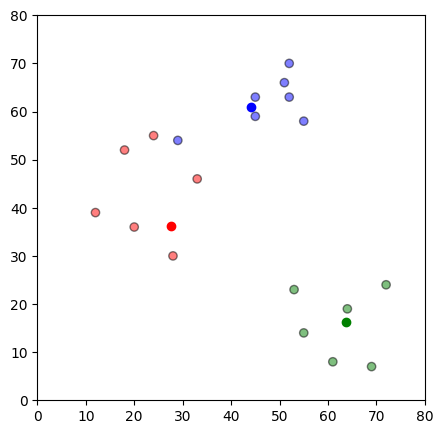

In [5]:
## Repeat Assignment Stage
"""
Assign new labels to the data points again. Based on our previous centroids.
"""
df = assignment(df, centroids)

# Plot results
fig = plt.figure(figsize=(5, 5))
plt.scatter(df['x'], df['y'], color=df['color'], alpha=0.5, edgecolor='k')
for i in centroids.keys():
    plt.scatter(*centroids[i], color=colmap[i])
plt.xlim(0, 80)
plt.ylim(0, 80)
plt.show()

Note that one of the reds is now green and one of the blues is now red.

We are getting closer.

We now repeat until there are no changes to any of the clusters.



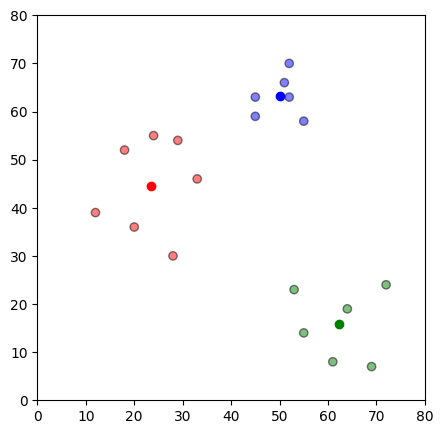

In [6]:
# Continue until all assigned categories don't change any more
"""
Setting up a while loop to make it run indefinitely until the centroids don't change any more.
"""
while True:
    closest_centroids = df['closest'].copy(deep=True) # this columns of data only used for comparison.
    centroids = update(centroids)
    df = assignment(df, centroids)
    if closest_centroids.equals(df['closest']):
        break


"""
Plot the chart
"""
fig = plt.figure(figsize=(5, 5))
plt.scatter(df['x'], df['y'], color=df['color'], alpha=0.5, edgecolor='k')
for i in centroids.keys():
    plt.scatter(*centroids[i], color=colmap[i])
plt.xlim(0, 80)
plt.ylim(0, 80)
plt.show()

So we have 3 clear clusters with 3 means at the centre of these clusters.

We will now repeat the above using scikit-learn, we first fit to our data

In [7]:
df = pd.DataFrame({
    'x': [12, 20, 28, 18, 29, 33, 24, 45, 45, 52, 51, 52, 55, 53, 55, 61, 64, 69, 72],
    'y': [39, 36, 30, 52, 54, 46, 55, 59, 63, 70, 66, 63, 58, 23, 14, 8, 19, 7, 24]
})

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3)
kmeans.fit(df)

/home/kin/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=3)

Then we learn the labels

In [8]:
labels = kmeans.predict(df)
centroids = kmeans.cluster_centers_

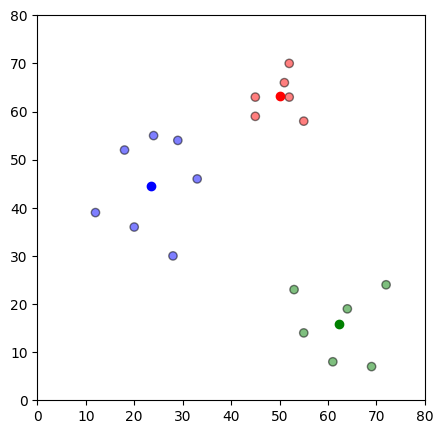

In [9]:
fig = plt.figure(figsize=(5, 5))

colors = list(map(lambda x: colmap[x+1], labels))

plt.scatter(df['x'], df['y'], color=colors, alpha=0.5, edgecolor='k')
for idx, centroid in enumerate(centroids):
    plt.scatter(*centroid, color=colmap[idx+1])
plt.xlim(0, 80)
plt.ylim(0, 80)
plt.show()

We get the exact same result, albeit with the colours in a different order.

Some things to take note of though:

- k-means clustering is very sensitive to scale due to its reliance on Euclidean distance so be sure to normalize data if there are likely to be scaling problems.
- If there are some symmetries in your data, some of the labels may be mis-labelled
- It is recommended to do the same k-means with different initial centroids and take the most common label.

<a href='#top'>jump to the top</a>

## 8.2 Hierarchical Clustering
 <a id='section2'></a>

There are two types of hierarchical clustering: Agglomerative and Divisive. In the former, data points are clustered using a bottom-up approach starting with individual data points, while in the latter top-down approach is followed where all the data points are treated as one big cluster and the clustering process involves dividing the one big cluster into several small clusters.

In this article we will focus on agglomerative clustering that involves the bottom-up approach.

Steps to Perform Hierarchical Clustering
Following are the steps involved in agglomerative clustering:

1. At the start, treat each data point as one cluster. Therefore, the number of clusters at the start will be K, while K is an integer representing the number of data points.
2. Form a cluster by joining the two closest data points resulting in K-1 clusters.
3. Form more clusters by joining the two closest clusters resulting in K-2 clusters.
4. Repeat the above three steps until one big cluster is formed.
5. Once single cluster is formed, dendrograms are used to divide into multiple clusters depending upon the problem. We will study the concept of dendrogram in detail in an upcoming section.

There are different ways to find distance between the clusters. The distance itself can be Euclidean or Manhattan distance. Following are some of the options to measure distance between two clusters:
- Measure the distance between the closes points of two clusters.
- Measure the distance between the farthest points of two clusters.
- Measure the distance between the centroids of two clusters.
- Measure the distance between all possible combination of points between the two clusters and take the mean.

### Role of Dendrograms for Hierarchical Clustering

In the last section, we said that once one large cluster is formed by the combination of small clusters, dendrograms of the cluster are used to actually split the cluster into multiple clusters of related data points. Let's see how it's actually done.

Suppose we have a collection of data points represented by a numpy array as follows:


In [10]:
import numpy as np

X = np.array([[5,3],
    [10,15],
    [15,12],
    [24,10],
    [30,30],
    [85,70],
    [71,80],
    [60,78],
    [70,55],
    [80,91],])

Let's plot the above data points. To do so, execute the following code:

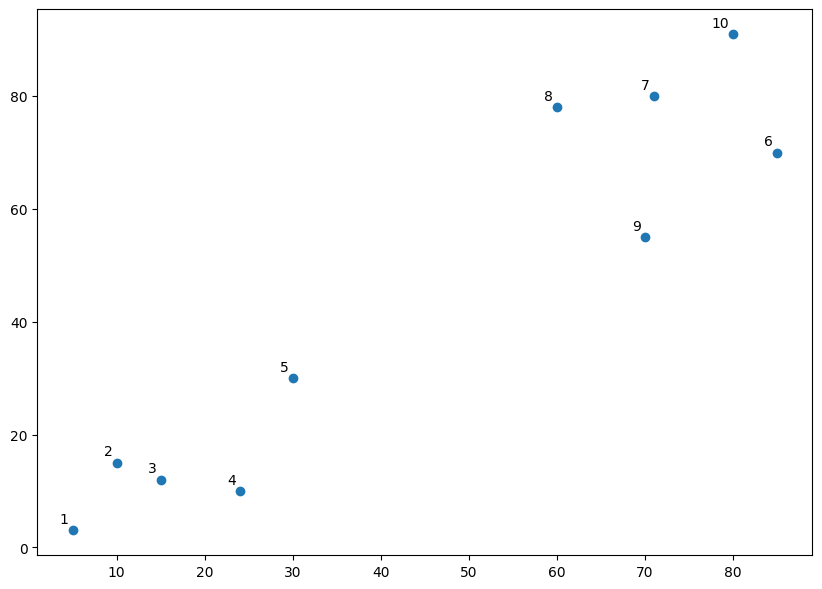

In [11]:
import matplotlib.pyplot as plt

labels = range(1, 11)
plt.figure(figsize=(10, 7))
plt.subplots_adjust(bottom=0.1)
plt.scatter(X[:,0],X[:,1], label='True Position')

for label, x, y in zip(labels, X[:, 0], X[:, 1]):
    plt.annotate(
        label,
        xy=(x, y), xytext=(-3, 3),
        textcoords='offset points', ha='right', va='bottom')
plt.show()

Let's name the above plot as Graph1. It can be seen from the naked eye that the data points form two clusters: first at the bottom left consisting of points 1-5 while second at the top right consisting of points 6-10.

However, in the real world, we may have thousands of data points in many more than 2 dimensions. In that case it would not be possible to spot clusters with the naked eye. This is why clustering algorithms have been developed.

Coming back to use of dendrograms in hierarchical clustering, let's draw the dendrograms for our data points. We will use the scipy library for that purpose. Execute the following script:

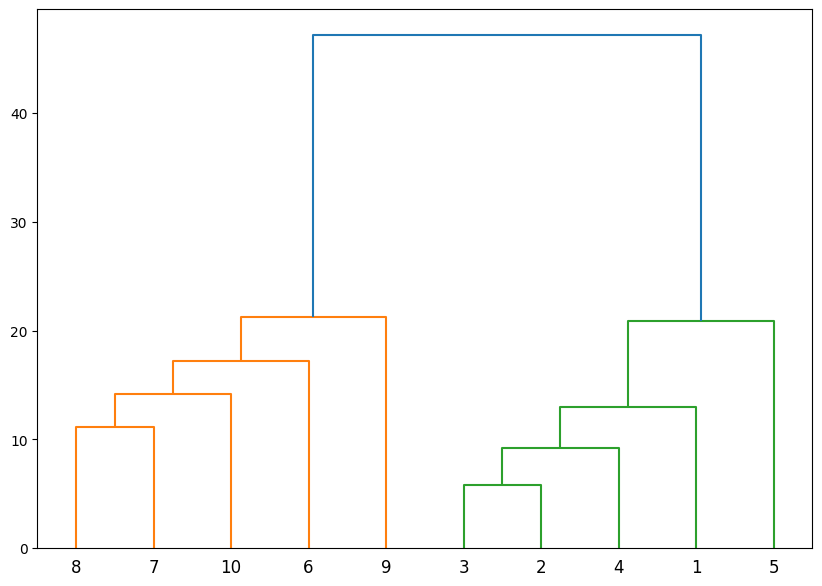

In [12]:
# Import necessary libraries
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

# Assuming X is a matrix or array containing the data points to be clustered
# Perform hierarchical clustering using single linkage method and store the results in 'linked'
linked = linkage(X, 'single')

# Create a list of labels for the data points (assuming there are 10 data points)
labelList = range(1, 11) # range(1,11) is a list of numbers from 1 to 10

# Set the size of the figure for the dendrogram plot
plt.figure(figsize=(10, 7))

# Plot the dendrogram using the hierarchical clustering results stored in 'linked'
dendrogram(linked,
           orientation='top',  # Display the dendrogram from top to bottom
           labels=labelList,  # Assign labels to the leaf nodes of the dendrogram
           distance_sort='descending',  # Sort the distances in descending order
           show_leaf_counts=True)  # Display the number of data points in each cluster

# Display the dendrogram plot
plt.show()


The algorithm starts by finding the two points that are closest to each other on the basis of Euclidean distance. If we look back at Graph1, we can see that points 2 and 3 are closest to each other while points 7 and 8 are closes to each other. Therefore a cluster will be formed between these two points first. In Graph2, you can see that the dendograms have been created joining points 2 with 3, and 8 with 7. The vertical height of the dendogram shows the Euclidean distances between points. From Graph2, it can be seen that Euclidean distance between points 8 and 7 is greater than the distance between point 2 and 3.

The next step is to join the cluster formed by joining two points to the next nearest cluster or point which in turn results in another cluster. If you look at Graph1, point 4 is closest to cluster of point 2 and 3, therefore in Graph2 dendrogram is generated by joining point 4 with dendrogram of point 2 and 3. This process continues until all the points are joined together to form one big cluster.

Once one big cluster is formed, the longest vertical distance without any horizontal line passing through it is selected and a horizontal line is drawn through it. The number of vertical lines this newly created horizontal line passes is equal to number of clusters. Take a look at the following plot:

<img src='https://s3.amazonaws.com/stackabuse/media/hierarchical-clustering-python-scikit-learn-3.png'>

We can see that the largest vertical distance without any horizontal line passing through it is represented by blue line. So we draw a new horizontal red line that passes through the blue line. Since it crosses the blue line at two points, therefore the number of clusters will be 2.

Basically the horizontal line is a threshold, which defines the minimum distance required to be a separate cluster. If we draw a line further down, the threshold required to be a new cluster will be decreased and more clusters will be formed as see in the image below:

<img src='https://s3.amazonaws.com/stackabuse/media/hierarchical-clustering-python-scikit-learn-4.png'>

In the above plot, the horizontal line passes through four vertical lines resulting in four clusters: cluster of points 6,7,8 and 10, cluster of points 3,2,4 and points 9 and 5 will be treated as single point clusters.

### Hierarchical Clustering via Scikit-Learn

Enough of the theory, now let's implement hierarchical clustering using Python's Scikit-Learn library.

### Example 1
In our first example we will cluster the X numpy array of data points that we created in the previous section.

The process of clustering is similar to any other unsupervised machine learning algorithm. We start by importing the required libraries:

In [13]:
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import numpy as np

X = np.array([[5,3],
    [10,15],
    [15,12],
    [24,10],
    [30,30],
    [85,70],
    [71,80],
    [60,78],
    [70,55],
    [80,91],])

The next step is to import the class for clustering and call its fit_predict method to predict the clusters that each data point belongs to.

Take a look at the following script:

In [14]:
# Import the AgglomerativeClustering module from the sklearn.cluster library
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
# n_clusters: Number of clusters to form
# affinity: Metric used to compute the linkage (distance between clusters), 'euclidean' in this case
# linkage: Criterion used to form clusters, 'ward' in this case

# Perform clustering on the data points and obtain cluster labels for each data point
cluster_labels = cluster.fit_predict(X)

/home/kin/.local/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In the code above we import the `AgglomerativeClustering` class from the "sklearn.cluster" library. The number of parameters is set to 2 using the `n_clusters` parameter while the `affinity` is set to "euclidean" (distance between the datapoints). Finally `linkage` parameter is set to "ward", which minimizes the variant between the clusters.

Next we call the `fit_predict` method from the `AgglomerativeClustering` class variable `cluster`. This method returns the names of the clusters that each data point belongs to. Execute the following script to see how the data points have been clustered.



In [15]:
print(cluster.labels_)

[1 1 1 1 1 0 0 0 0 0]


The output is a one-dimensional array of 10 elements corresponding to the clusters assigned to our 10 data points.

As expected the first five points have been clustered together while the last five points have been clustered together. It is important to mention here that these ones and zeros are merely labels assigned to the clusters and have no mathematical implications.

Finally, let's plot our clusters. To do so, execute the following code:

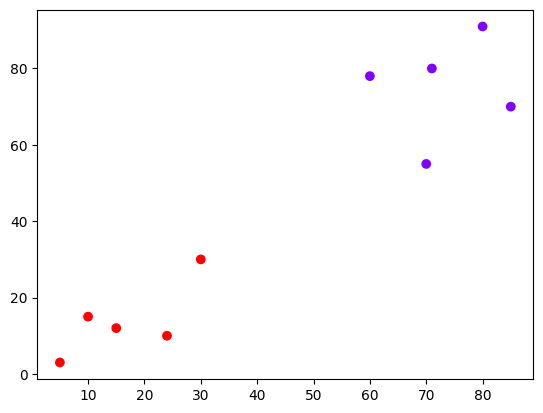

In [16]:
plt.scatter(X[:,0],X[:,1], c=cluster.labels_, cmap='rainbow')

You can see points in two clusters where the first five points clustered together and the last five points clustered together.

### Example 2

In the last section we performed hierarchical clustering on dummy data. In this example, we will perform hierarchical clustering on real-world data and see how it can be used to solve an actual problem.

The problem that we are going to solve in this section is to segment customers into different groups based on their shopping trends.

To cluster this data into groups we will follow the same steps that we performed in the previous section.

Execute the following script to import the desired libraries:

In [17]:
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import numpy as np

customer_data = pd.read_csv('shopping-data.csv')
customer_data.shape

(200, 5)

The script above will return `(200, 5)` which means that the dataset contains 200 records and 5 attributes.

To eyeball the dataset, execute the `head()` function of the data frame. Take a look at the following script:

In [18]:
customer_data.head()

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


Our dataset has five columns: CustomerID, Genre, Age, Annual Income, and Spending Score. To view the results in two-dimensional feature space, we will retain only two of these five columns. We can remove CustomerID column, Genre, and Age column. We will retain the Annual Income (in thousands of dollars) and Spending Score (1-100) columns. The Spending Score column signifies how often a person spends money in a mall on a scale of 1 to 100 with 100 being the highest spender. Execute the following script to filter the first three columns from our dataset:

In [19]:
"""We just take the last 2 columns from the dataframe"""

data = customer_data.iloc[:, 3:5].values

print(data)

[[ 15  39]
 [ 15  81]
 [ 16   6]
 [ 16  77]
 [ 17  40]
 [ 17  76]
 [ 18   6]
 [ 18  94]
 [ 19   3]
 [ 19  72]
 [ 19  14]
 [ 19  99]
 [ 20  15]
 [ 20  77]
 [ 20  13]
 [ 20  79]
 [ 21  35]
 [ 21  66]
 [ 23  29]
 [ 23  98]
 [ 24  35]
 [ 24  73]
 [ 25   5]
 [ 25  73]
 [ 28  14]
 [ 28  82]
 [ 28  32]
 [ 28  61]
 [ 29  31]
 [ 29  87]
 [ 30   4]
 [ 30  73]
 [ 33   4]
 [ 33  92]
 [ 33  14]
 [ 33  81]
 [ 34  17]
 [ 34  73]
 [ 37  26]
 [ 37  75]
 [ 38  35]
 [ 38  92]
 [ 39  36]
 [ 39  61]
 [ 39  28]
 [ 39  65]
 [ 40  55]
 [ 40  47]
 [ 40  42]
 [ 40  42]
 [ 42  52]
 [ 42  60]
 [ 43  54]
 [ 43  60]
 [ 43  45]
 [ 43  41]
 [ 44  50]
 [ 44  46]
 [ 46  51]
 [ 46  46]
 [ 46  56]
 [ 46  55]
 [ 47  52]
 [ 47  59]
 [ 48  51]
 [ 48  59]
 [ 48  50]
 [ 48  48]
 [ 48  59]
 [ 48  47]
 [ 49  55]
 [ 49  42]
 [ 50  49]
 [ 50  56]
 [ 54  47]
 [ 54  54]
 [ 54  53]
 [ 54  48]
 [ 54  52]
 [ 54  42]
 [ 54  51]
 [ 54  55]
 [ 54  41]
 [ 54  44]
 [ 54  57]
 [ 54  46]
 [ 57  58]
 [ 57  55]
 [ 58  60]
 [ 58  46]
 [ 59  55]

Next, we need to know the clusters that we want our data to be split to. We will again use the scipy library to create the dendrograms for our dataset. Execute the following script to do so:

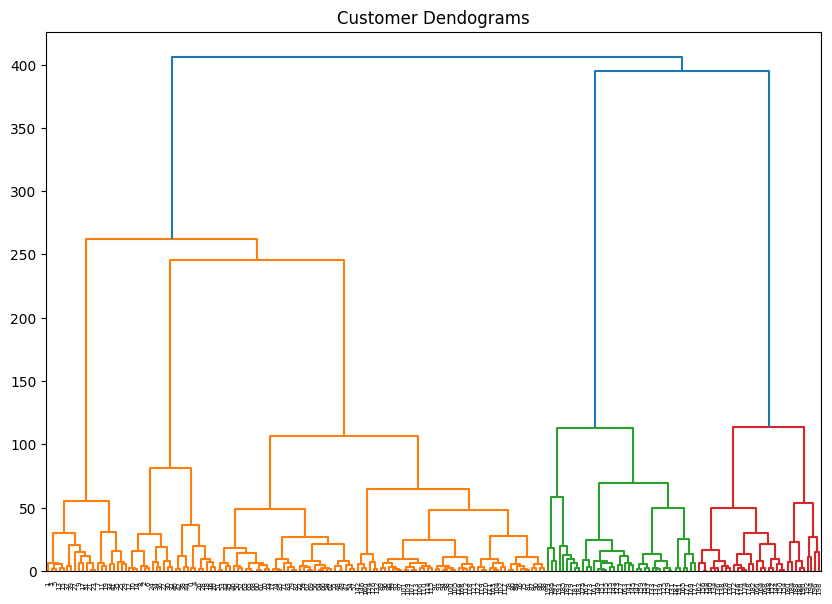

In [20]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))
plt.title("Customer Dendograms")

# We combine 2 steps as one.
dend = shc.dendrogram(shc.linkage(data, method='ward'))

In the script above we import the hierarchy class of the `scipy.cluster` library as `shc`. The hierarchy class has a `dendrogram` method which takes the value returned by the linkage method of the same class. The `linkage` method takes the dataset and the method to minimize distances as parameters. We use 'ward' as the `method` since it minimizes then variants of distances between the clusters.

If we draw a horizontal line that passes through longest distance without a horizontal line, we get 5 clusters as shown in the following figure:

<img src='https://s3.amazonaws.com/stackabuse/media/hierarchical-clustering-python-scikit-learn-7.png'>

Now we know the number of clusters for our dataset, the next step is to group the data points into these five clusters. To do so we will again use the `AgglomerativeClustering` class of the `sklearn.cluster` library. Take a look at the following script:

In [21]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
cluster.fit_predict(data)

/home/kin/.local/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3,
       4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 1,
       4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 0, 2, 0, 2,
       1, 2, 0, 2, 0, 2, 0, 2, 0, 2, 1, 2, 0, 2, 1, 2, 0, 2, 0, 2, 0, 2,
       0, 2, 0, 2, 0, 2, 1, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2,
       0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2,
       0, 2])

You can see the cluster labels from all of your data points. Since we had five clusters, we have five labels in the output i.e. 0 to 4.

As a final step, let's plot the clusters to see how actually our data has been clustered:

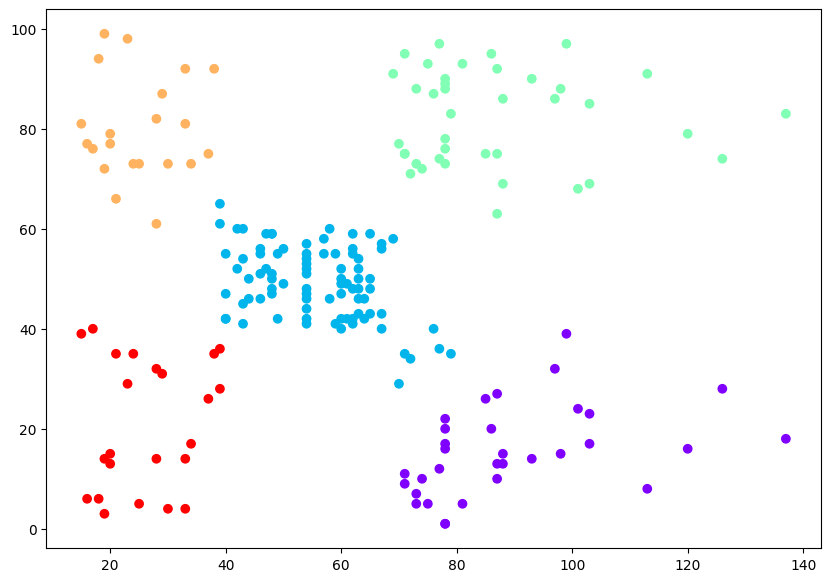

In [22]:
plt.figure(figsize=(10, 7))

"""
x axis - annual income
y axis - spending score
c: the clustering labels obtained from the AgglomerativeClustering algorithm
"""
plt.scatter(data[:,0], data[:,1], c=cluster.labels_, cmap='rainbow')

You can see the data points in the form of five clusters. The data points in the bottom right belong to the customers with high salaries but low spending. These are the customers that spend their money carefully. Similarly, the customers at top right (green data points), these are the customers with high salaries and high spending. These are the type of customers that companies target. The customers in the middle (blue data points) are the ones with average income and average salaries. The highest numbers of customers belong to this category. Companies can also target these customers given the fact that they are in huge numbers, etc.


<a href='#top'>jump to the top</a>